# Data Import

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
#df = pd.read_csv(io.BytesIO(uploaded['CC GENERAL.csv']))
df = pd.read_csv('CC GENERAL.csv')
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


# Data Preprocessing

In [3]:
# Checking for missing values
missing_values = df.isnull().sum()

# Checking data types
data_types = df.dtypes

# Checking for duplicate rows
duplicate_rows = df.duplicated().sum()

missing_values, data_types, duplicate_rows

(CUST_ID                               0
 BALANCE                               0
 BALANCE_FREQUENCY                     0
 PURCHASES                             0
 ONEOFF_PURCHASES                      0
 INSTALLMENTS_PURCHASES                0
 CASH_ADVANCE                          0
 PURCHASES_FREQUENCY                   0
 ONEOFF_PURCHASES_FREQUENCY            0
 PURCHASES_INSTALLMENTS_FREQUENCY      0
 CASH_ADVANCE_FREQUENCY                0
 CASH_ADVANCE_TRX                      0
 PURCHASES_TRX                         0
 CREDIT_LIMIT                          1
 PAYMENTS                              0
 MINIMUM_PAYMENTS                    313
 PRC_FULL_PAYMENT                      0
 TENURE                                0
 dtype: int64,
 CUST_ID                              object
 BALANCE                             float64
 BALANCE_FREQUENCY                   float64
 PURCHASES                           float64
 ONEOFF_PURCHASES                    float64
 INSTALLMENTS_PURCHASE

In [4]:
#too many unreasonble values
sum(df['MINIMUM_PAYMENTS'] > df['PAYMENTS'])

2365

In [5]:
# Calculate the median values for CREDIT_LIMIT and MINIMUM_PAYMENTS
median_credit_limit = df['CREDIT_LIMIT'].median()

# Impute missing values with the calculated medians
df['CREDIT_LIMIT'].fillna(median_credit_limit, inplace=True)

In [6]:
#drop cust_id and minimum_payments
df.drop(columns=['MINIMUM_PAYMENTS'], axis=1, inplace=True)
df.drop(["CUST_ID"], axis=1, inplace=True)

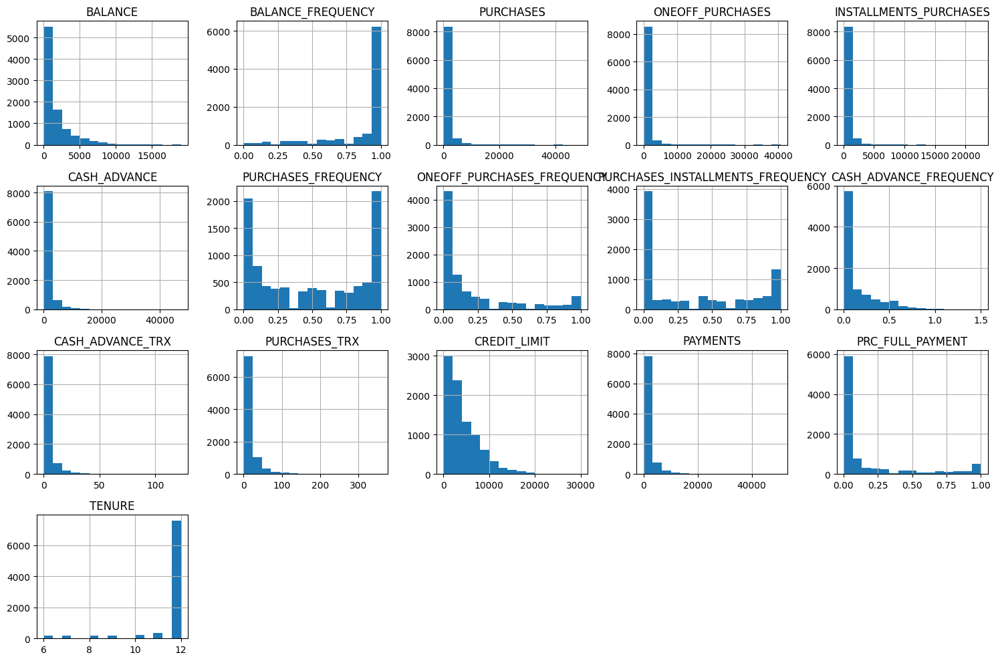

In [7]:
# Generating histograms for each column to understand their distributions
df.hist(bins=15, figsize=(15, 10), layout=(4, 5))
plt.tight_layout()
plt.show()

In [8]:
# filter out CASH_ADVANCE_FREQUENCY > 1
df = df[df['CASH_ADVANCE_FREQUENCY'] <= 1]
# reset indices
df.reset_index(drop=True, inplace=True)

df_transformed = df.copy()

# transformation to address skewness in data
df_transformed.loc[:, df.max(axis=0) > 20] = np.arcsinh(df_transformed.loc[:, df_transformed.max(axis=0) > 20])

print(df_transformed.shape)

(8942, 16)


# Exploratory Data Analysis

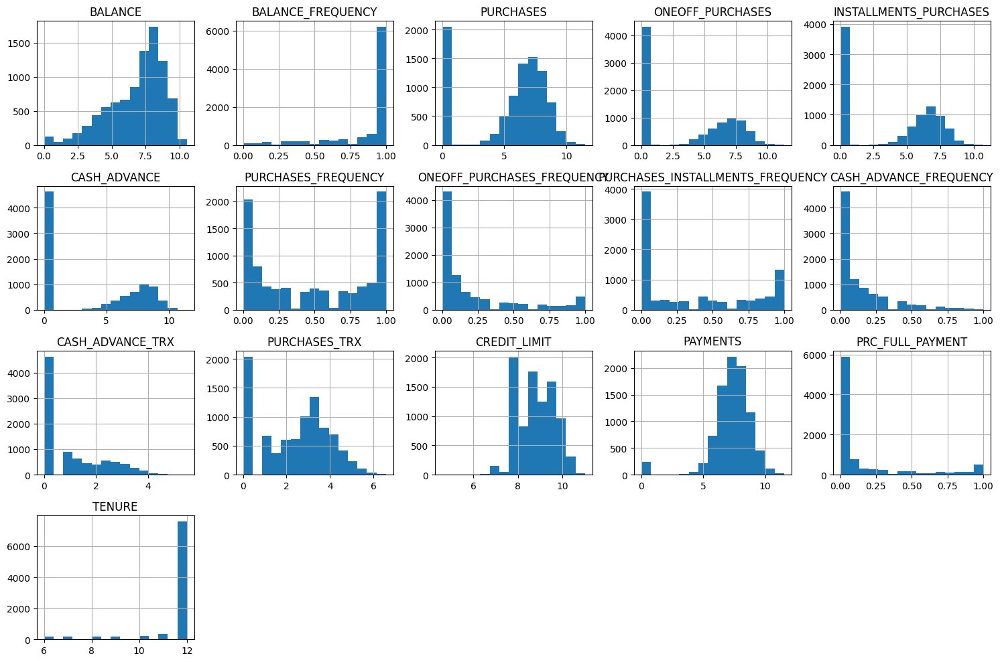

In [9]:
# Generating histograms for each column to understand their distributions
df_transformed.hist(bins=15, figsize=(15, 10), layout=(4, 5))
plt.tight_layout()
plt.show()

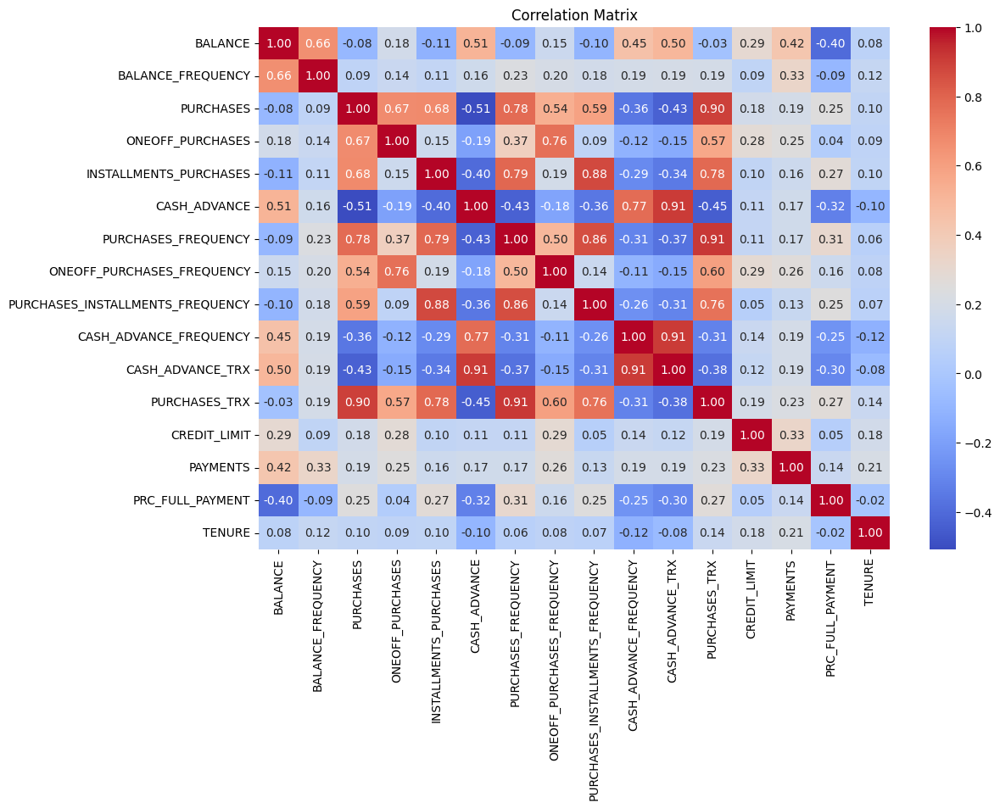

In [10]:
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.heatmap(df_transformed.corr(), annot=True, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Matrix")
plt.show()

# PCA for visualization

In [11]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px

In [12]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_transformed)

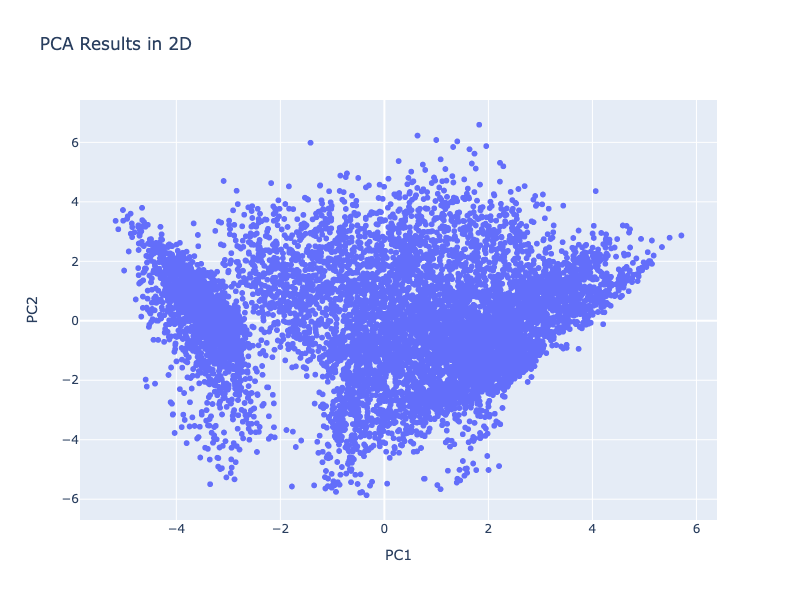

In [13]:
# Applying PCA for 2 components
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Creating a DataFrame for the PCA results
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

# Visualization in 2D
fig = px.scatter(pca_df, x='PC1', y='PC2', title="PCA Results in 2D", width=600, height=600)
fig.show()

# Determine number of clusters

## Kmeans

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` expl

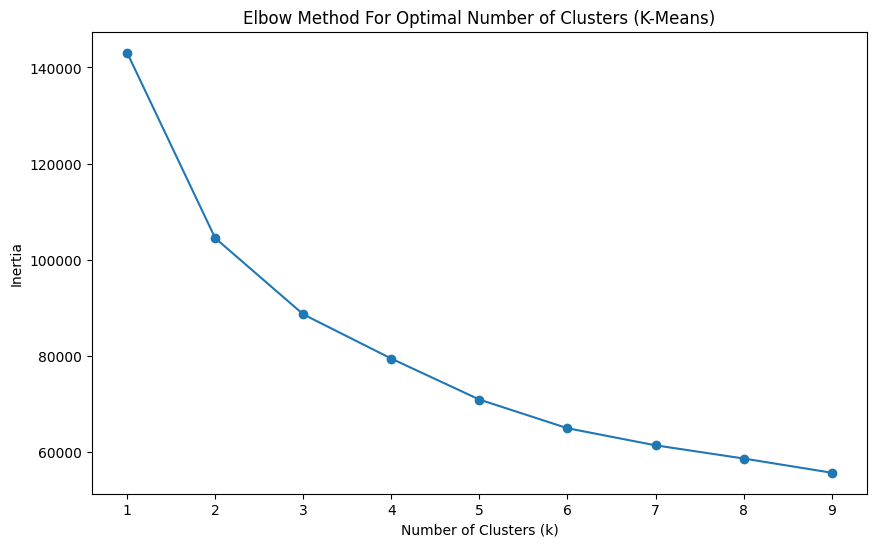

In [14]:
from sklearn.cluster import KMeans

k_values = range(1, 10)

inertia_scores = []

# Calculate K-Means for each k and store inertia
for k in k_values:
    kmeans = KMeans(n_clusters=k, random_state=42).fit(scaled_data)
    inertia_scores.append(kmeans.inertia_)

# Calculate differences in inertia
inertia_differences = [inertia_scores[i] - inertia_scores[i - 1] for i in range(1, len(inertia_scores))]

# Plotting the elbow plot
plt.figure(figsize=(10, 6))
plt.plot(k_values, inertia_scores, marker='o')
plt.title('Elbow Method For Optimal Number of Clusters (K-Means)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.show()

Choose 5 for Kmeans

## Spectral Clustering

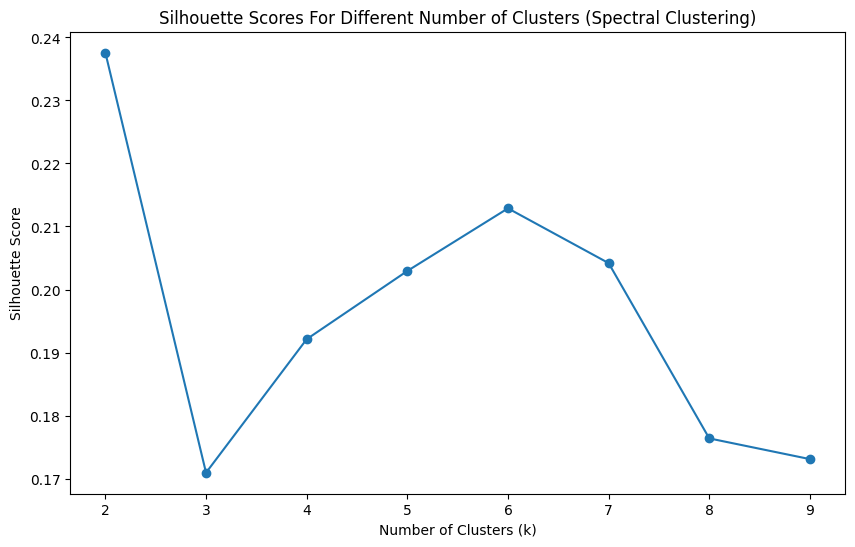

In [15]:
from sklearn.cluster import SpectralClustering
from sklearn.metrics import silhouette_score


k_values = range(2, 10)  # Silhouette score is not defined for k=1

# To store the silhouette scores
silhouette_scores = []

# Calculate Spectral Clustering for each k and store silhouette score
for k in k_values:
    spectral = SpectralClustering(n_clusters=k, random_state=42, affinity='nearest_neighbors')
    labels = spectral.fit_predict(scaled_data)
    score = silhouette_score(scaled_data, labels)
    silhouette_scores.append(score)


# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Scores For Different Number of Clusters (Spectral Clustering)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()

Choose 6 for Spectral Clustering

# GMM

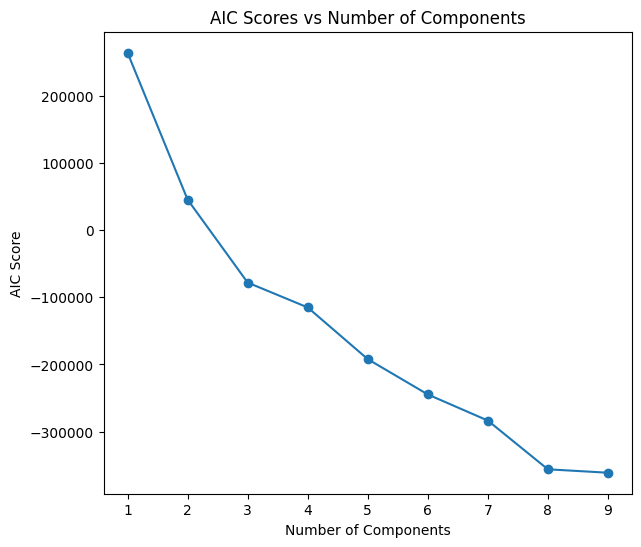

In [16]:
from sklearn.mixture import GaussianMixture

n_components_range = range(1, 10)

# To store the AIC values
aic_scores = []

# Calculate GMM for each number of clusters and store AIC
for n in n_components_range:
    gmm = GaussianMixture(n_components=n, random_state=42)
    gmm.fit(scaled_data)
    aic_scores.append(gmm.aic(scaled_data))


# Plotting the AIC scores
plt.figure(figsize=(15, 6))

plt.subplot(1, 2, 1)
plt.plot(n_components_range, aic_scores, marker='o')
plt.title('AIC Scores vs Number of Components')
plt.xlabel('Number of Components')
plt.ylabel('AIC Score')

plt.show()


Choose 8 for GMM

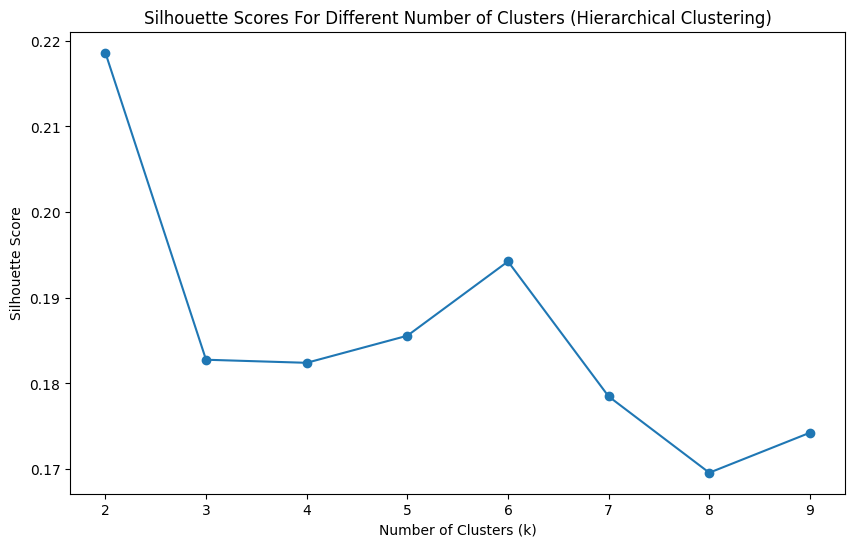

In [17]:
from sklearn.cluster import AgglomerativeClustering

k_values = range(2, 10)  # Silhouette score is not defined for k=1

# To store the silhouette scores
silhouette_scores = []

# Calculate Hierarchical Clustering for each k and store silhouette score
for k in k_values:
    hierarchical = AgglomerativeClustering(n_clusters=k)
    labels = hierarchical.fit_predict(scaled_data)
    score = silhouette_score(scaled_data, labels)
    silhouette_scores.append(score)


# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(k_values, silhouette_scores, marker='o')
plt.title('Silhouette Scores For Different Number of Clusters (Hierarchical Clustering)')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.show()


Choose 6 for hierarchical clustering

# Apply Clustering

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



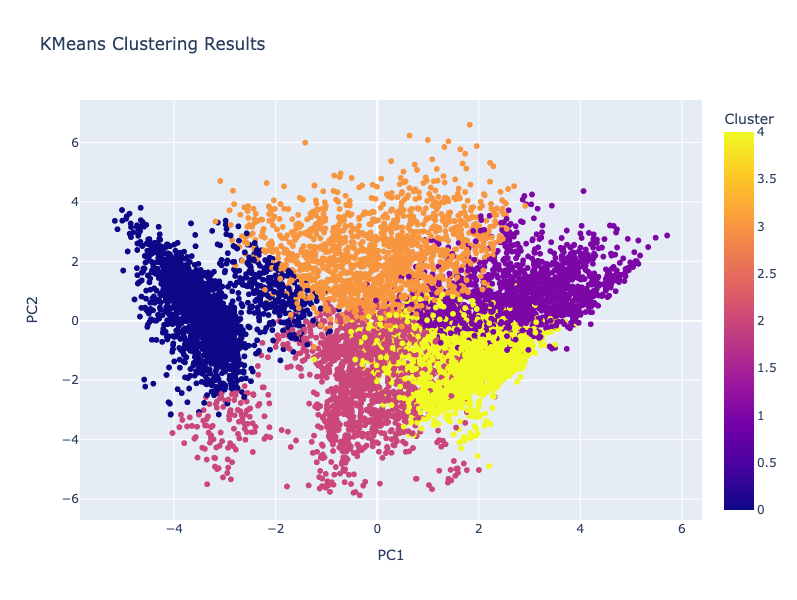

In [18]:
# Using KMeans for clustering
kmeans = KMeans(n_clusters=5, random_state=42)
clusters_kmeans = kmeans.fit_predict(scaled_data)

# Create a DataFrame for visualization
visualization_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
visualization_df['Cluster'] = clusters_kmeans

# Create a scatter plot
fig = px.scatter(visualization_df, x='PC1', y='PC2', color='Cluster', title="KMeans Clustering Results" ,width=600, height=600)
fig.show()

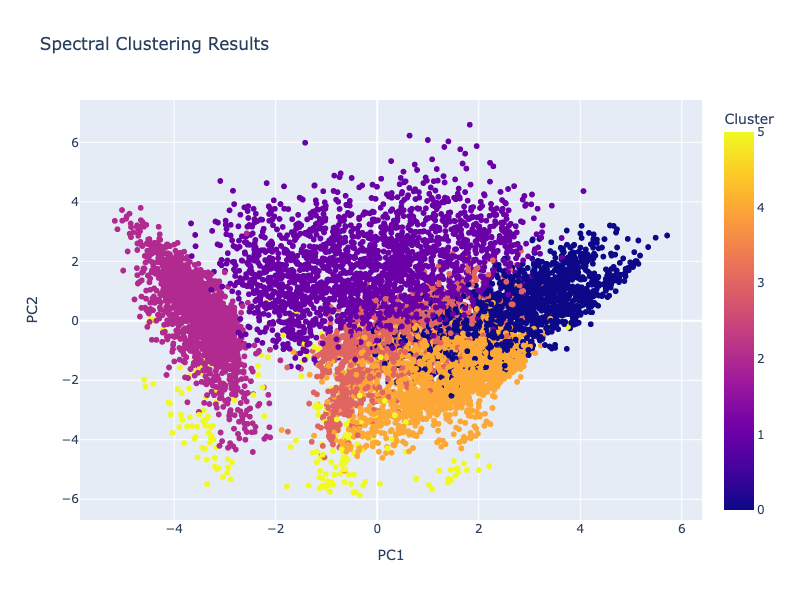

In [19]:
# Using Spectral CLustering for clustering
spectral_clustering = SpectralClustering(n_clusters = 6, affinity='nearest_neighbors', random_state=42)
clusters_spectral = spectral_clustering.fit_predict(scaled_data)

# Create a DataFrame for visualization
visualization_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
visualization_df['Cluster'] = clusters_spectral

# Create a scatter plot
fig = px.scatter(visualization_df, x='PC1', y='PC2', color='Cluster', title="Spectral Clustering Results", width=600, height=600)
fig.show()


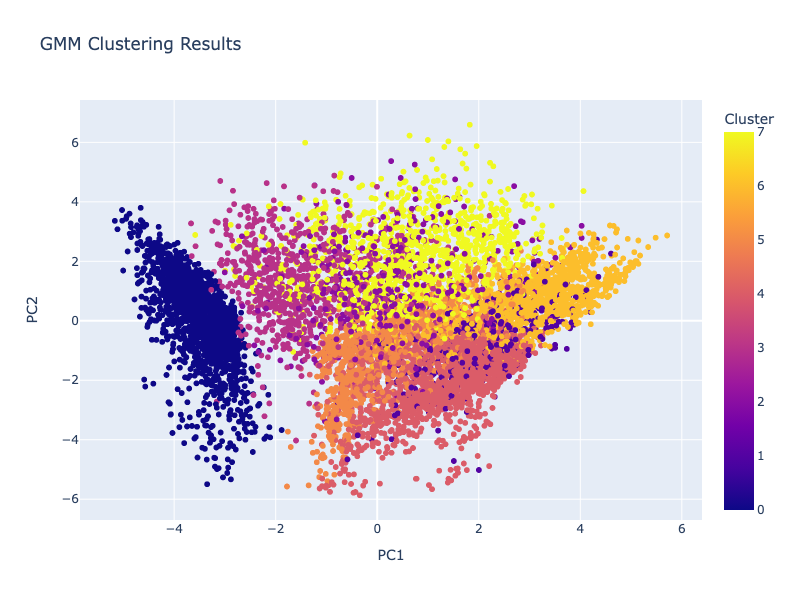

In [20]:
# Use Gaussian Mixture Model for clustering
gmm = GaussianMixture(n_components=8, random_state=42)
clusters_gmm = gmm.fit_predict(scaled_data)

# Create a DataFrame for visualization
visualization_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
visualization_df['Cluster'] = clusters_gmm

# Create a scatter plot
fig = px.scatter(visualization_df, x='PC1', y='PC2', color='Cluster', title="GMM Clustering Results", width=600, height=600)
fig.show()


/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:983: FutureWarning:

Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead



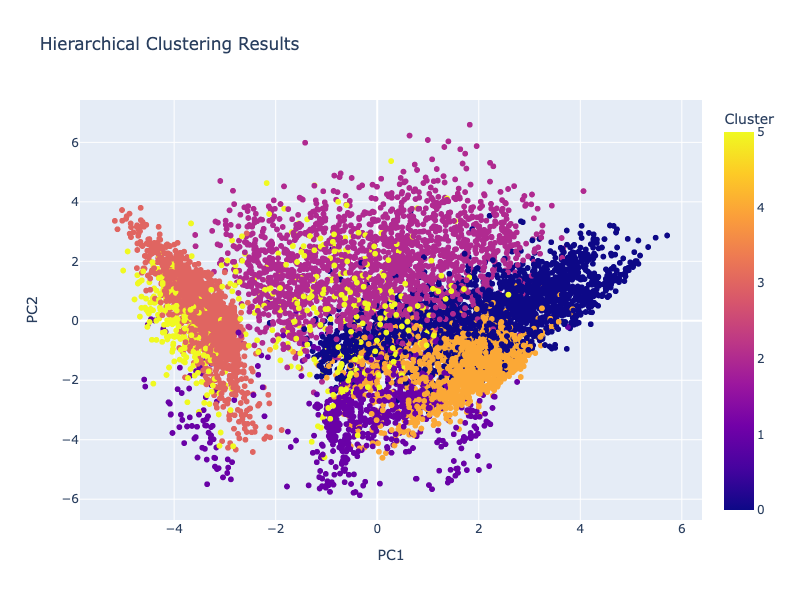

In [21]:
# Use Hierarchical Clustering for clustering
hierarchical = AgglomerativeClustering(n_clusters=6, affinity='euclidean', linkage='ward')
clusters_hierarchical = hierarchical.fit_predict(scaled_data)

# Create a DataFrame for visualization
visualization_df = pd.DataFrame(pca_result, columns=['PC1', 'PC2'])
visualization_df['Cluster'] = clusters_hierarchical

# Create a scatter plot
fig = px.scatter(visualization_df, x='PC1', y='PC2', color='Cluster', title="Hierarchical Clustering Results", width=600, height=600)
fig.show()


# Cluster Analysis

## PCA for selecting the important factors

In [22]:
# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df)

# Apply PCA
pca = PCA()
X_pca = pca.fit_transform(X_scaled)

# Create a DataFrame with the PCA components
components_df = pd.DataFrame(pca.components_, columns=df.columns, index=[f'PC{i+1}' for i in range(len(df.columns))])

# Show the DataFrame
components_df

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,PRC_FULL_PAYMENT,TENURE
PC1,0.091556,0.117329,0.411823,0.346732,0.336631,-0.030515,0.325206,0.296833,0.277509,-0.095722,-0.054992,0.391358,0.208277,0.262667,0.137253,0.079617
PC2,0.398696,0.131660,0.054248,0.077505,-0.014186,0.447736,-0.185947,-0.004435,-0.177230,0.442466,0.428324,-0.010273,0.247839,0.272573,-0.181704,-0.001297
PC3,-0.115400,-0.425489,0.261923,0.392603,-0.101919,-0.078927,-0.403766,0.090632,-0.494919,-0.170506,-0.184624,-0.082677,0.105568,0.252560,0.068612,-0.021578
PC4,-0.281099,-0.374540,0.016867,-0.054102,0.139300,0.236017,0.095796,-0.174200,0.182228,0.168122,0.242664,-0.003912,-0.139567,0.186458,0.467638,-0.519188
PC5,0.080030,-0.305448,-0.089942,-0.245432,0.238248,0.128260,-0.065017,-0.426116,0.165711,-0.165838,-0.064012,-0.077116,0.304029,0.194648,0.187623,0.585170
PC6,0.152392,-0.131514,0.197397,0.024879,0.421043,-0.101191,-0.151021,-0.444486,0.115110,-0.043757,-0.130552,0.115244,-0.192051,0.012289,-0.582653,-0.299993
PC7,-0.361858,0.171018,0.157836,0.158917,0.081298,-0.035068,-0.112786,-0.111251,-0.038188,0.183096,0.274720,0.064811,-0.619801,0.165373,-0.003507,0.480146
PC8,0.102723,0.654492,0.101945,0.053616,0.142528,-0.056382,-0.217977,-0.349817,-0.119581,-0.085505,-0.220544,-0.221204,0.025001,0.107605,0.432406,-0.189954
PC9,0.034074,-0.079663,0.050173,-0.177300,0.444313,-0.356554,-0.251176,0.112759,-0.255235,0.281456,0.217343,0.249372,0.157625,-0.467282,0.243697,0.042645
PC10,0.165073,-0.126879,0.199467,0.448822,-0.352884,-0.354493,0.116951,-0.370018,0.282664,0.212150,0.206271,-0.203463,0.141935,-0.272875,0.087126,0.059940


In [23]:
#assume we chose the best clustering and apply it to label the original and transformed data
df['Cluster'] = clusters_spectral
df_transformed['Cluster'] = clusters_spectral
df.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,PRC_FULL_PAYMENT,TENURE,Cluster
0,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,0.000000,12,4
1,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,0.222222,12,2
2,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,0.000000,12,3
3,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.000000,12,5
4,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,0.000000,12,3


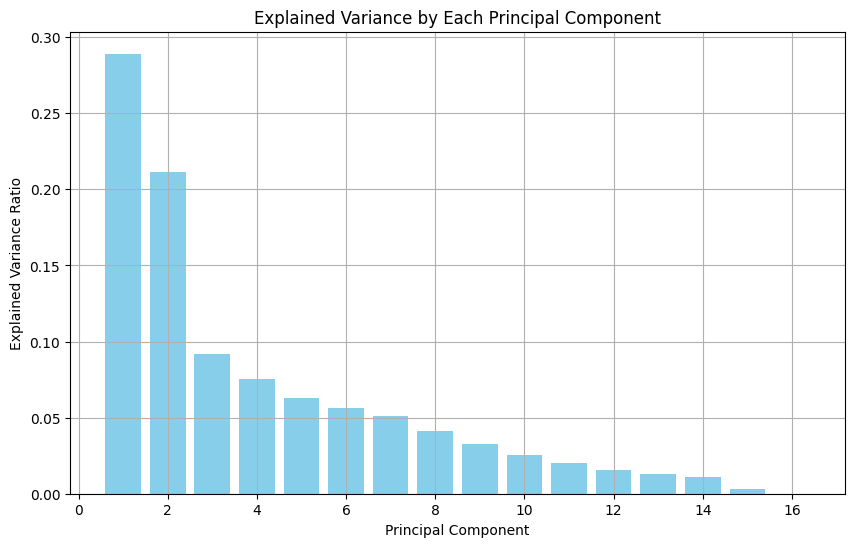

In [24]:
plt.figure(figsize=(10, 6))
plt.bar(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_, color='skyblue')
plt.title('Explained Variance by Each Principal Component')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.grid(True)
plt.show()

## EDA for clusters

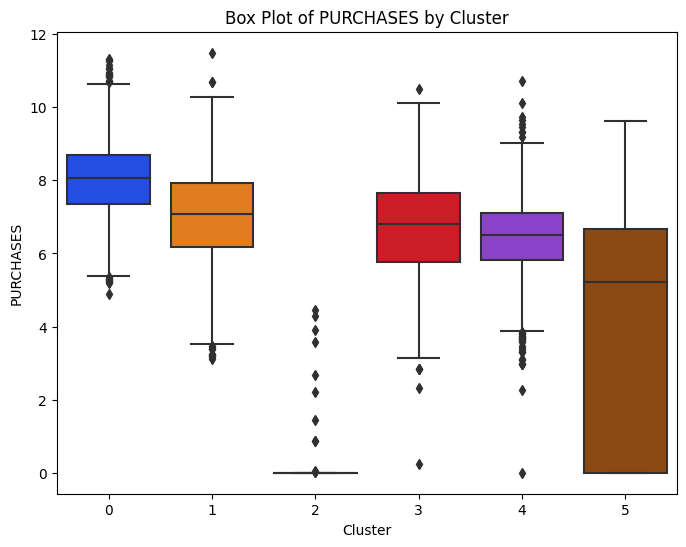

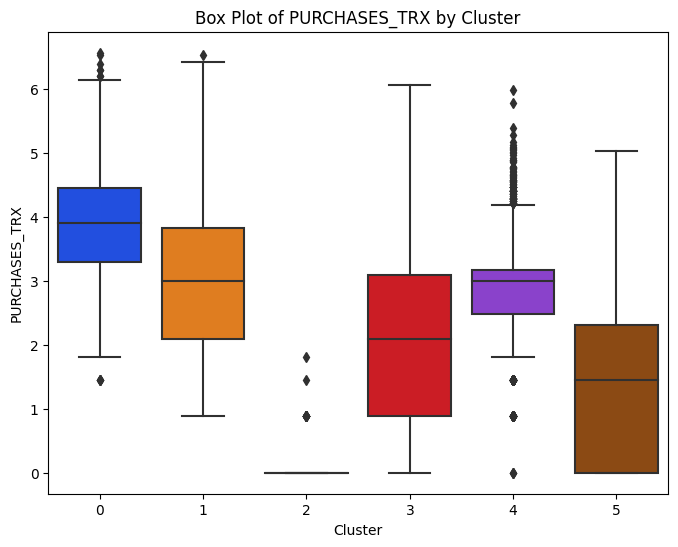

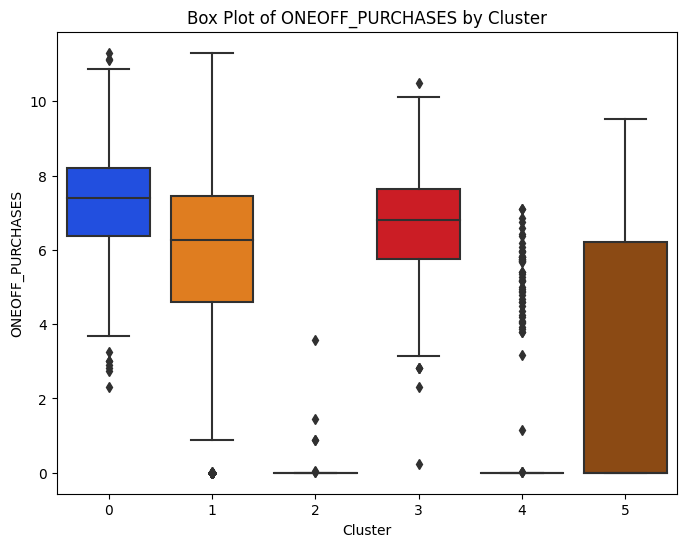

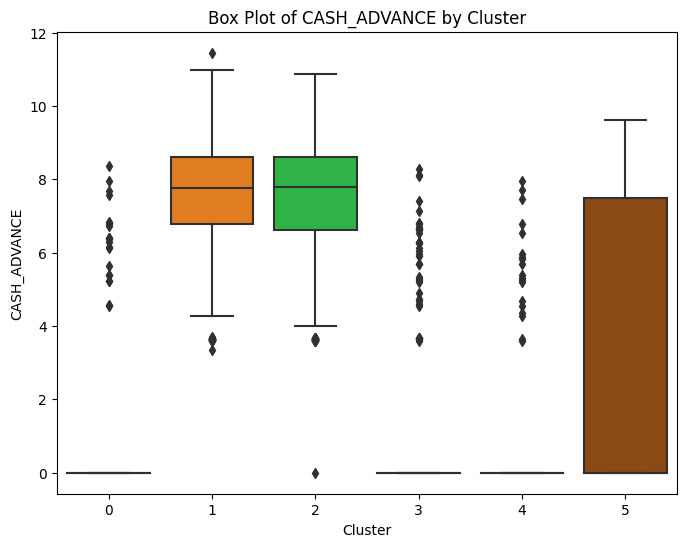

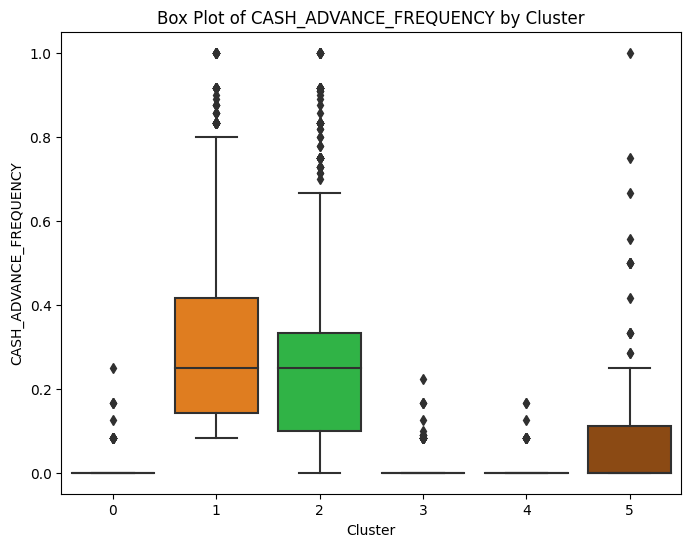

In [25]:
# Strong contrasting colors for clusters
palette = sns.color_palette("bright")

# Function to plot box plot for a given variable
def plot_box(var, palette):
    plt.figure(figsize=(8, 6))
    sns.boxplot(data=df_transformed, x='Cluster', y=var, palette=palette)
    plt.title(f'Box Plot of {var} by Cluster')
    plt.xlabel('Cluster')
    plt.ylabel(var)
    plt.show()

# Top 5 important variables
top_5_vars = ['PURCHASES', 'PURCHASES_TRX', 'ONEOFF_PURCHASES', 'CASH_ADVANCE', 'CASH_ADVANCE_FREQUENCY']

# Creating box plots for each of the top 5 variables from pca result
for var in top_5_vars:
    plot_box(var, palette)
